In [209]:
import numpy as np
import glob
import matplotlib.image as plt
import cv2
import os
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split




In [210]:
def get_hog_features(img,orient,pix_per_cell,cell_per_block,vis=False,feature_vec=True):
    if vis==True:
        features, hog_image = hog(img,orientations=orient,pixels_per_cell=(pix_per_cell,pix_per_cell),
                       cells_per_block=(cell_per_block,cell_per_block),block_norm="L2-Hys",
                      transform_sqrt=True,visualise=vis,feature_vector=feature_vec)
        return features,hog_image
    else:
        features = hog(img,orientations=orient,pixels_per_cell=(pix_per_cell,pix_per_cell),
                       cells_per_block=(cell_per_block,cell_per_block),block_norm="L2-Hys",
                      transform_sqrt=True,visualise=vis,feature_vector=feature_vec)
        return features
    
# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features  
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features


# Here is your draw_boxes function from the previous exercise
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy
    
    
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched 
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    
   
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    #     Note: you could vectorize this step, but in practice
    #     you'll be considering windows one by one with your
    #     classifier, so looping makes sense
        # Calculate each window position
        # Append window position to list
    # Return the list of windows
    for ys in range(ny_windows):
        for nx in range(nx_windows):
            startx = nx*nx_pix_per_step+x_start_stop[0]
            endx=startx+xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            window_list.append(((startx, starty), (endx, endy)))
            
    return window_list
# Define a function to extract features from a single image window
# This function is very similar to extract_features()
# just for a single image rather than list of images
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)
# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
   
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img,  scale):
    
    img_boxex=[]
    
    draw_img= np.copy(img)
    heatmap=np.zeros_like(img[:,:,0])
    img=img.astype(np.float32)/255
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
# Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
# 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
 
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                img_boxex.append(((xbox_left,ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart,xbox_left:xbox_left+win_draw] +=1

    return draw_img,heatmap
    

In [211]:
def visualise_output(orignal_img,window_title1,output_image,window_title2):
    # Plot the examples
    
   
    fig = plt.figure()
    plt.subplot(121)
    plt.imshow(orignal_img,cmap='gray')
    plt.title(window_title1)
    plt.subplot(122)
    plt.imshow(output_image,cmap='gray')
    plt.title(window_title2)
def visualise(fig,rows,cols,imgs,titles):
    for i,img in enumerate(imgs):
        plt.subplot(rows,cols,i+1)
        plt.title(i+1)
        img_dim = len(img.shape)
        if img_dim < 3:
            plt.imshow(img,cmap='gray')
            plt.title(titles[i])
        else:
            plt.imshow(img)
            plt.title(titles[i])
            
        
    

In [212]:
## Extracting Cars and not cars images from vehicles and non-vehicles directory

In [213]:
cars=[]
notcars=[]

basedir_car = "vehicles/"
sub_dir_car = os.listdir(basedir_car)
for folder in sub_dir_car:
    cars.extend(glob.glob(basedir_car+folder+"/*"))


basedir_notcar = "non-vehicles/"
sub_dir_notcar = os.listdir(basedir_notcar)
for folder in sub_dir_notcar:
    notcars.extend(glob.glob(basedir_notcar+folder+"/*"))

    




In [214]:
##Diplay rendom seleted car and not car image  

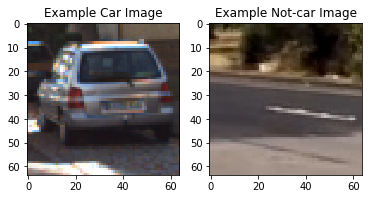

In [215]:
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))
# Read in car / not-car images
car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])
visualise_output(car_image,'Example Car Image',notcar_image,'Example Not-car Image')


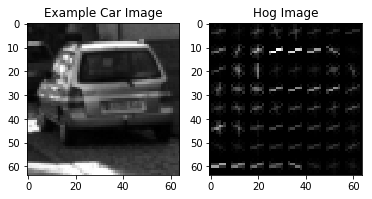

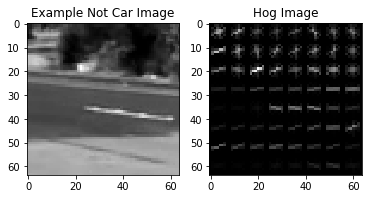

In [216]:
# sample_size=1000
# cars=cars[0:sample_size]
# notcars = notcars[0:sample_size]

# print("SampleCar found : ",len(cars))
# print("Sample No Car found : ",len(notcars))
gray_image = cv2.cvtColor(car_image,cv2.COLOR_RGB2GRAY)

colorspace = 'ALL' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 11
pix_per_cell = 8
cell_per_block = 2
hog_channel = '1' # Can be 0, 1, 2, or "ALL"
features,hog_imgage = get_hog_features(gray_image,orient,pix_per_cell,cell_per_block,vis=True,feature_vec=True)
visualise_output(gray_image,'Example Car Image',hog_imgage,'Hog Image')

gray_not_car_image = cv2.cvtColor(notcar_image,cv2.COLOR_RGB2GRAY)


features,hog_imgage = get_hog_features(gray_not_car_image,orient,pix_per_cell,cell_per_block,vis=True,feature_vec=True)
visualise_output(gray_not_car_image,'Example Not Car Image',hog_imgage,'Hog Image')





In [217]:

import time
# Reduce the sample size because
# The quiz evaluator times out after 13s of CPU time
sample_size = 1000
random_indexes= np.random.randint(0,len(cars),sample_size)
test_cars = np.array(cars)[random_indexes]
test_notcars = np.array(notcars)[random_indexes]

color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 11  # HOG orientations
pix_per_cell = 16 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

car_features = extract_features(test_cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(test_notcars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=rand_state)
    
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X_train)
# Apply the scaler to X
X_train = X_scaler.transform(X_train)
X_test = X_scaler.transform(X_test)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()

Using: 11 orientations 16 pixels per cell and 2 cells per block
Feature vector length: 2004
1.29 Seconds to train SVC...
Test Accuracy of SVC =  0.9725


['test_images/test6.jpg', 'test_images/test5.jpg', 'test_images/test4.jpg', 'test_images/test1.jpg', 'test_images/test3.jpg', 'test_images/test2.jpg']


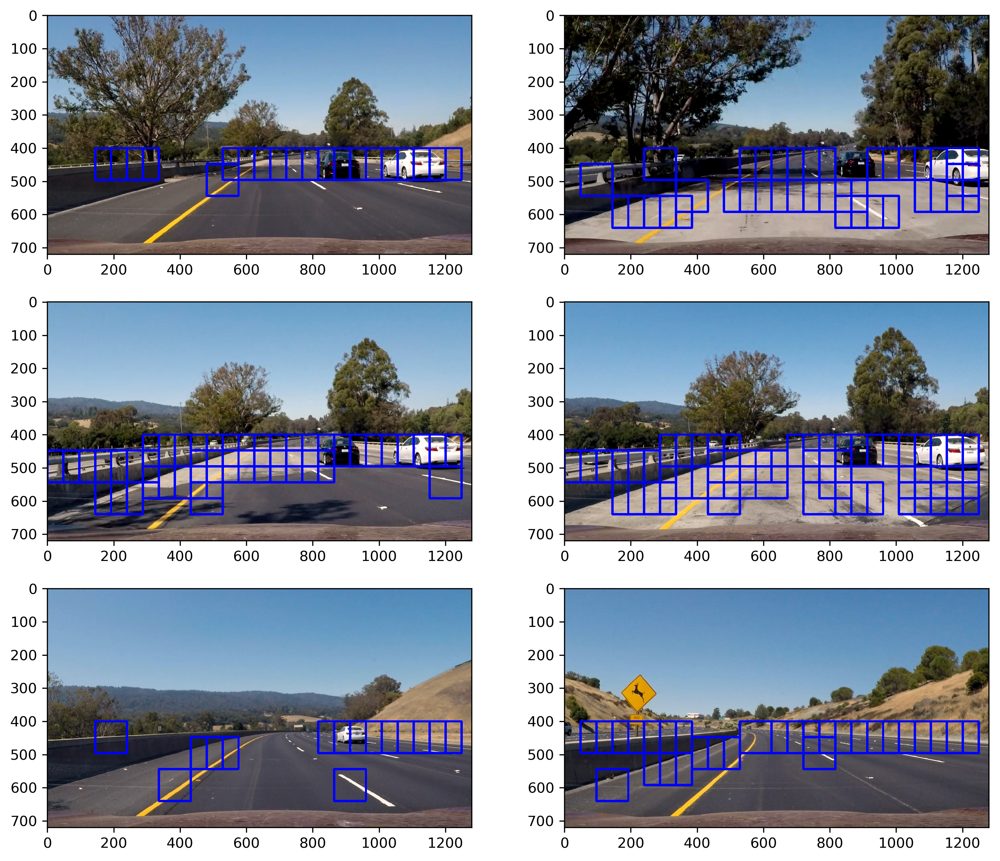

In [218]:

test_images = glob.glob("test_images/*.jpg")
print(test_images)
images=[]
titles=[]
y_start_stop = [400, 656] # Min and max in y to search in slide_window()

overlap=0.50
xy_window=(96,96)


for test_img in test_images:
    img=mpimg.imread(test_img)
    draw_img = np.copy(img)
    img= img.astype(np.float32)/255
    
#    
    windows= slide_window(img,x_start_stop = [None, None],y_start_stop = y_start_stop,
                         xy_window=xy_window,xy_overlap=(overlap,overlap))
    
    hot_window = search_windows(img,windows=windows,clf=svc,scaler=X_scaler,
                    spatial_size=spatial_size, hist_bins=hist_bins, 
                    hist_range=(0,255), orient=orient, 
                    pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                    hog_channel=hog_channel, spatial_feat=spatial_feat, 
                    hist_feat=hist_feat, hog_feat=hog_feat)
    windows_img= draw_boxes(draw_img,hot_window,color=(0,0,255),thick=5)
    images.append(windows_img)
    titles.append('')

fig = plt.figure(figsize=(12,18),dpi=300)
visualise(fig,5,2,images,titles)



In [219]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img,cv2.COLOR_RGB2YCrCb)
        
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)



test_images/test6.jpg
test_images/test5.jpg
test_images/test4.jpg
test_images/test1.jpg
test_images/test3.jpg
test_images/test2.jpg


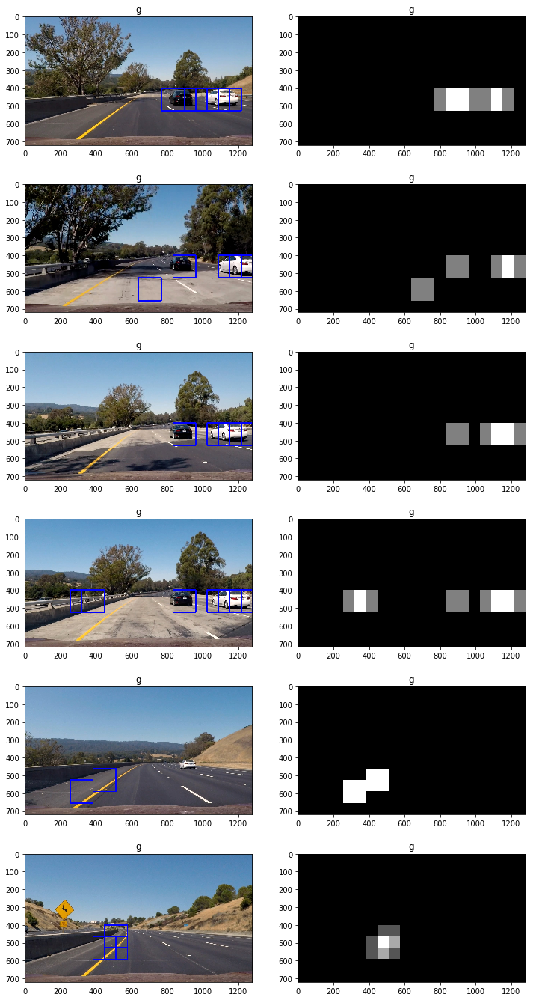

In [187]:
%matplotlib inline
out_images=[]
out_maps=[]
out_titles=[]
out_boxes=[]

y_start=400
y_stop=656
scale=2
test_images = glob.glob("test_images/*.jpg")
for test_img in test_images:
    img_boxex=[]
    print(test_img)
    img = mpimg.imread(test_img)
    draw_img= np.copy(img)
    heatmap=np.zeros_like(img[:,:,0])
    img=img.astype(np.float32)/255
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
# Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
# 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
 
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                img_boxex.append(((xbox_left,ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart,xbox_left:xbox_left+win_draw] +=1
            
    out_images.append(draw_img)
    out_titles.append(test_img[-1:])
    out_titles.append(test_img[-1:])
    out_images.append(heatmap)
    out_maps.append(heatmap)
    out_boxes.append(img_boxex)
            
fig = plt.figure(figsize=(12,24))
visualise(fig,6,2,out_images,out_titles)
# print(len(out_images))
# plt.imshow(out_images[8],cmap='gray')

   


test_images/test2.jpg
test_images/test2.jpg
test_images/test2.jpg
test_images/test2.jpg
test_images/test2.jpg
test_images/test2.jpg


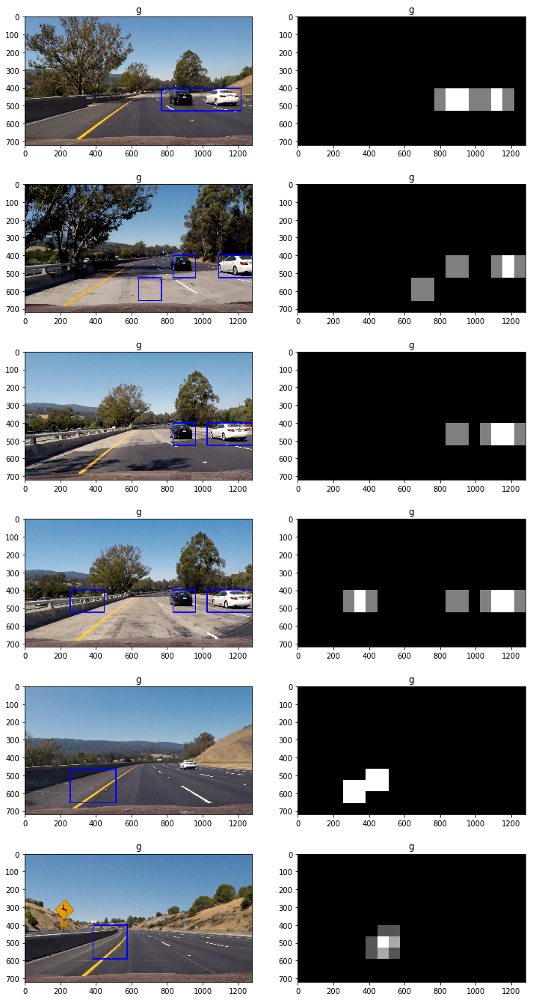

In [208]:
out_images=[]
out_maps=[]
out_titles=[]

y_start=400
y_stop=656
scale=2
test_images = glob.glob("test_images/*.jpg")
for img_src in test_images:
    img=mpimg.imread(img_src)
    out_image,heat_map = find_cars(img,scale)
    labels = label(heat_map)
    draw_img = np.copy(img)
    draw_img = draw_labeled_bboxes(draw_img,labels)
    out_images.append(draw_img)
    out_images.append(heat_map)
    out_titles.append(img_src[-1:])
    out_titles.append(img_src[-1:])
fig = plt.figure(figsize=(12,24))
visualise(fig,6,2,out_images,out_titles)
    

In [201]:
def process_image(img):
    out_image,heat_map = find_cars(img,scale)
    labels = label(heat_map)
    draw_img = np.copy(img)
    draw_img = draw_labeled_bboxes(draw_img,labels)
    return draw_img
    
    

In [204]:
from moviepy.editor import VideoFileClip
output_video='test_output.mp4'
clip = VideoFileClip("project_video.mp4")
test_clip = clip.fl_image(process_image)
%time test_clip.write_videofile(output_video,audio=False)

test_images/test2.jpg
[MoviePy] >>>> Building video test_output.mp4
[MoviePy] Writing video test_output.mp4


  0%|          | 0/1261 [00:00<?, ?it/s]

test_images/test2.jpg


  0%|          | 1/1261 [00:00<03:18,  6.33it/s]

test_images/test2.jpg


  0%|          | 2/1261 [00:00<03:07,  6.72it/s]

test_images/test2.jpg


  0%|          | 3/1261 [00:00<02:59,  7.01it/s]

test_images/test2.jpg


  0%|          | 4/1261 [00:00<02:51,  7.34it/s]

test_images/test2.jpg


  0%|          | 5/1261 [00:00<02:42,  7.73it/s]

test_images/test2.jpg


  0%|          | 6/1261 [00:00<02:36,  8.02it/s]

test_images/test2.jpg


  1%|          | 7/1261 [00:00<02:35,  8.06it/s]

test_images/test2.jpg


  1%|          | 8/1261 [00:01<02:40,  7.79it/s]

test_images/test2.jpg


  1%|          | 9/1261 [00:01<02:34,  8.11it/s]

test_images/test2.jpg


  1%|          | 10/1261 [00:01<02:27,  8.46it/s]

test_images/test2.jpg


  1%|          | 11/1261 [00:01<02:27,  8.48it/s]

test_images/test2.jpg


  1%|          | 12/1261 [00:01<02:27,  8.49it/s]

test_images/test2.jpg


  1%|          | 13/1261 [00:01<02:28,  8.39it/s]

test_images/test2.jpg


  1%|          | 14/1261 [00:01<02:32,  8.17it/s]

test_images/test2.jpg


  1%|          | 15/1261 [00:01<02:37,  7.91it/s]

test_images/test2.jpg


  1%|▏         | 16/1261 [00:02<02:44,  7.58it/s]

test_images/test2.jpg


  1%|▏         | 17/1261 [00:02<02:51,  7.26it/s]

test_images/test2.jpg


  1%|▏         | 18/1261 [00:02<02:49,  7.34it/s]

test_images/test2.jpg


  2%|▏         | 19/1261 [00:02<02:45,  7.52it/s]

test_images/test2.jpg


  2%|▏         | 20/1261 [00:02<02:41,  7.66it/s]

test_images/test2.jpg


  2%|▏         | 21/1261 [00:02<02:40,  7.73it/s]

test_images/test2.jpg


  2%|▏         | 22/1261 [00:02<02:39,  7.79it/s]

test_images/test2.jpg


  2%|▏         | 24/1261 [00:03<02:23,  8.64it/s]

test_images/test2.jpg
test_images/test2.jpg


  2%|▏         | 27/1261 [00:03<02:12,  9.29it/s]

test_images/test2.jpg
test_images/test2.jpg


  2%|▏         | 28/1261 [00:03<02:23,  8.57it/s]

test_images/test2.jpg
test_images/test2.jpg


  2%|▏         | 30/1261 [00:03<02:33,  8.04it/s]

test_images/test2.jpg
test_images/test2.jpg


  3%|▎         | 32/1261 [00:04<02:57,  6.92it/s]

test_images/test2.jpg
test_images/test2.jpg


  3%|▎         | 34/1261 [00:04<02:43,  7.52it/s]

test_images/test2.jpg
test_images/test2.jpg


  3%|▎         | 37/1261 [00:04<02:19,  8.77it/s]

test_images/test2.jpg
test_images/test2.jpg


  3%|▎         | 38/1261 [00:04<02:19,  8.74it/s]

test_images/test2.jpg
test_images/test2.jpg


  3%|▎         | 40/1261 [00:04<02:22,  8.57it/s]

test_images/test2.jpg
test_images/test2.jpg


  3%|▎         | 42/1261 [00:05<02:15,  9.02it/s]

test_images/test2.jpg
test_images/test2.jpg


  3%|▎         | 44/1261 [00:05<02:17,  8.84it/s]

test_images/test2.jpg
test_images/test2.jpg


  4%|▎         | 46/1261 [00:05<02:13,  9.08it/s]

test_images/test2.jpg
test_images/test2.jpg


  4%|▍         | 48/1261 [00:05<02:14,  9.01it/s]

test_images/test2.jpg
test_images/test2.jpg


  4%|▍         | 50/1261 [00:06<02:15,  8.92it/s]

test_images/test2.jpg
test_images/test2.jpg


  4%|▍         | 52/1261 [00:06<02:19,  8.66it/s]

test_images/test2.jpg
test_images/test2.jpg


  4%|▍         | 54/1261 [00:06<02:14,  9.00it/s]

test_images/test2.jpg
test_images/test2.jpg


  4%|▍         | 56/1261 [00:06<02:33,  7.85it/s]

test_images/test2.jpg
test_images/test2.jpg


  5%|▍         | 58/1261 [00:07<02:41,  7.43it/s]

test_images/test2.jpg
test_images/test2.jpg


  5%|▍         | 60/1261 [00:07<02:42,  7.40it/s]

test_images/test2.jpg
test_images/test2.jpg


  5%|▍         | 62/1261 [00:07<02:49,  7.08it/s]

test_images/test2.jpg
test_images/test2.jpg


  5%|▌         | 64/1261 [00:07<02:51,  6.98it/s]

test_images/test2.jpg
test_images/test2.jpg


  5%|▌         | 66/1261 [00:08<02:49,  7.04it/s]

test_images/test2.jpg
test_images/test2.jpg


  5%|▌         | 68/1261 [00:08<02:48,  7.08it/s]

test_images/test2.jpg
test_images/test2.jpg


  6%|▌         | 70/1261 [00:08<02:34,  7.71it/s]

test_images/test2.jpg
test_images/test2.jpg


  6%|▌         | 72/1261 [00:08<02:24,  8.22it/s]

test_images/test2.jpg
test_images/test2.jpg


  6%|▌         | 74/1261 [00:09<02:23,  8.25it/s]

test_images/test2.jpg
test_images/test2.jpg


  6%|▌         | 76/1261 [00:09<02:18,  8.57it/s]

test_images/test2.jpg
test_images/test2.jpg


  6%|▌         | 78/1261 [00:09<02:13,  8.89it/s]

test_images/test2.jpg
test_images/test2.jpg


  6%|▋         | 80/1261 [00:09<02:10,  9.05it/s]

test_images/test2.jpg
test_images/test2.jpg


  7%|▋         | 82/1261 [00:10<02:07,  9.22it/s]

test_images/test2.jpg
test_images/test2.jpg


  7%|▋         | 84/1261 [00:10<02:09,  9.10it/s]

test_images/test2.jpg
test_images/test2.jpg


  7%|▋         | 86/1261 [00:10<02:10,  8.97it/s]

test_images/test2.jpg
test_images/test2.jpg


  7%|▋         | 88/1261 [00:10<02:11,  8.93it/s]

test_images/test2.jpg
test_images/test2.jpg


  7%|▋         | 90/1261 [00:10<02:14,  8.72it/s]

test_images/test2.jpg
test_images/test2.jpg


  7%|▋         | 92/1261 [00:11<02:11,  8.87it/s]

test_images/test2.jpg
test_images/test2.jpg


  7%|▋         | 94/1261 [00:11<02:13,  8.73it/s]

test_images/test2.jpg
test_images/test2.jpg


  8%|▊         | 96/1261 [00:11<02:33,  7.61it/s]

test_images/test2.jpg
test_images/test2.jpg


  8%|▊         | 98/1261 [00:12<02:41,  7.19it/s]

test_images/test2.jpg
test_images/test2.jpg


  8%|▊         | 100/1261 [00:12<02:46,  6.97it/s]

test_images/test2.jpg
test_images/test2.jpg


  8%|▊         | 102/1261 [00:12<02:41,  7.18it/s]

test_images/test2.jpg
test_images/test2.jpg


  8%|▊         | 104/1261 [00:12<02:41,  7.18it/s]

test_images/test2.jpg
test_images/test2.jpg


  8%|▊         | 106/1261 [00:13<02:24,  7.99it/s]

test_images/test2.jpg
test_images/test2.jpg


  9%|▊         | 108/1261 [00:13<02:16,  8.47it/s]

test_images/test2.jpg
test_images/test2.jpg


  9%|▊         | 110/1261 [00:13<02:09,  8.86it/s]

test_images/test2.jpg
test_images/test2.jpg


  9%|▉         | 112/1261 [00:13<02:23,  7.98it/s]

test_images/test2.jpg
test_images/test2.jpg


  9%|▉         | 114/1261 [00:14<02:20,  8.19it/s]

test_images/test2.jpg
test_images/test2.jpg


  9%|▉         | 116/1261 [00:14<02:19,  8.22it/s]

test_images/test2.jpg
test_images/test2.jpg


  9%|▉         | 118/1261 [00:14<02:18,  8.27it/s]

test_images/test2.jpg
test_images/test2.jpg


 10%|▉         | 120/1261 [00:14<02:17,  8.28it/s]

test_images/test2.jpg
test_images/test2.jpg


 10%|▉         | 122/1261 [00:15<02:36,  7.25it/s]

test_images/test2.jpg
test_images/test2.jpg


 10%|▉         | 124/1261 [00:15<02:47,  6.80it/s]

test_images/test2.jpg
test_images/test2.jpg


 10%|█         | 127/1261 [00:15<02:17,  8.24it/s]

test_images/test2.jpg
test_images/test2.jpg


 10%|█         | 128/1261 [00:15<02:20,  8.04it/s]

test_images/test2.jpg
test_images/test2.jpg


 10%|█         | 130/1261 [00:16<02:31,  7.48it/s]

test_images/test2.jpg
test_images/test2.jpg


 10%|█         | 132/1261 [00:16<02:22,  7.94it/s]

test_images/test2.jpg
test_images/test2.jpg


 11%|█         | 134/1261 [00:16<02:14,  8.40it/s]

test_images/test2.jpg
test_images/test2.jpg


 11%|█         | 136/1261 [00:16<02:33,  7.34it/s]

test_images/test2.jpg
test_images/test2.jpg


 11%|█         | 138/1261 [00:17<02:42,  6.93it/s]

test_images/test2.jpg
test_images/test2.jpg


 11%|█         | 140/1261 [00:17<02:24,  7.77it/s]

test_images/test2.jpg
test_images/test2.jpg


 11%|█▏        | 142/1261 [00:17<02:24,  7.75it/s]

test_images/test2.jpg
test_images/test2.jpg


 11%|█▏        | 144/1261 [00:17<02:20,  7.94it/s]

test_images/test2.jpg
test_images/test2.jpg


 12%|█▏        | 146/1261 [00:18<02:11,  8.48it/s]

test_images/test2.jpg
test_images/test2.jpg


 12%|█▏        | 148/1261 [00:18<02:09,  8.61it/s]

test_images/test2.jpg
test_images/test2.jpg


 12%|█▏        | 151/1261 [00:18<02:00,  9.19it/s]

test_images/test2.jpg
test_images/test2.jpg


 12%|█▏        | 152/1261 [00:18<02:01,  9.15it/s]

test_images/test2.jpg
test_images/test2.jpg


 12%|█▏        | 154/1261 [00:19<02:23,  7.69it/s]

test_images/test2.jpg
test_images/test2.jpg


 12%|█▏        | 156/1261 [00:19<02:33,  7.22it/s]

test_images/test2.jpg
test_images/test2.jpg


 13%|█▎        | 158/1261 [00:19<02:31,  7.30it/s]

test_images/test2.jpg
test_images/test2.jpg


 13%|█▎        | 160/1261 [00:19<02:22,  7.73it/s]

test_images/test2.jpg
test_images/test2.jpg


 13%|█▎        | 162/1261 [00:20<02:36,  7.04it/s]

test_images/test2.jpg
test_images/test2.jpg


 13%|█▎        | 164/1261 [00:20<02:42,  6.75it/s]

test_images/test2.jpg
test_images/test2.jpg


 13%|█▎        | 166/1261 [00:20<02:33,  7.13it/s]

test_images/test2.jpg
test_images/test2.jpg


 13%|█▎        | 168/1261 [00:21<02:17,  7.93it/s]

test_images/test2.jpg
test_images/test2.jpg


 13%|█▎        | 170/1261 [00:21<02:10,  8.38it/s]

test_images/test2.jpg
test_images/test2.jpg


 14%|█▎        | 172/1261 [00:21<02:08,  8.50it/s]

test_images/test2.jpg
test_images/test2.jpg


 14%|█▍        | 174/1261 [00:21<02:31,  7.16it/s]

test_images/test2.jpg
test_images/test2.jpg


 14%|█▍        | 176/1261 [00:22<02:37,  6.90it/s]

test_images/test2.jpg
test_images/test2.jpg


 14%|█▍        | 178/1261 [00:22<02:39,  6.77it/s]

test_images/test2.jpg
test_images/test2.jpg


 14%|█▍        | 180/1261 [00:22<02:43,  6.63it/s]

test_images/test2.jpg
test_images/test2.jpg


 14%|█▍        | 182/1261 [00:22<02:40,  6.72it/s]

test_images/test2.jpg
test_images/test2.jpg


 15%|█▍        | 184/1261 [00:23<02:49,  6.35it/s]

test_images/test2.jpg
test_images/test2.jpg


 15%|█▍        | 186/1261 [00:23<02:43,  6.58it/s]

test_images/test2.jpg
test_images/test2.jpg


 15%|█▍        | 188/1261 [00:23<02:25,  7.37it/s]

test_images/test2.jpg
test_images/test2.jpg


 15%|█▌        | 190/1261 [00:24<02:14,  7.96it/s]

test_images/test2.jpg
test_images/test2.jpg


 15%|█▌        | 192/1261 [00:24<02:15,  7.90it/s]

test_images/test2.jpg
test_images/test2.jpg


 15%|█▌        | 194/1261 [00:24<02:07,  8.37it/s]

test_images/test2.jpg
test_images/test2.jpg


 16%|█▌        | 196/1261 [00:24<02:08,  8.29it/s]

test_images/test2.jpg
test_images/test2.jpg


 16%|█▌        | 198/1261 [00:25<02:04,  8.51it/s]

test_images/test2.jpg
test_images/test2.jpg


 16%|█▌        | 200/1261 [00:25<02:03,  8.57it/s]

test_images/test2.jpg
test_images/test2.jpg


 16%|█▌        | 202/1261 [00:25<02:04,  8.53it/s]

test_images/test2.jpg
test_images/test2.jpg


 16%|█▌        | 204/1261 [00:25<02:04,  8.47it/s]

test_images/test2.jpg
test_images/test2.jpg


 16%|█▋        | 206/1261 [00:25<02:04,  8.47it/s]

test_images/test2.jpg
test_images/test2.jpg


 16%|█▋        | 208/1261 [00:26<02:26,  7.17it/s]

test_images/test2.jpg
test_images/test2.jpg


 17%|█▋        | 210/1261 [00:26<02:29,  7.02it/s]

test_images/test2.jpg
test_images/test2.jpg


 17%|█▋        | 212/1261 [00:26<02:35,  6.74it/s]

test_images/test2.jpg
test_images/test2.jpg


 17%|█▋        | 214/1261 [00:27<02:28,  7.04it/s]

test_images/test2.jpg
test_images/test2.jpg


 17%|█▋        | 216/1261 [00:27<02:35,  6.72it/s]

test_images/test2.jpg
test_images/test2.jpg


 17%|█▋        | 218/1261 [00:27<02:24,  7.21it/s]

test_images/test2.jpg
test_images/test2.jpg


 17%|█▋        | 220/1261 [00:28<02:39,  6.51it/s]

test_images/test2.jpg
test_images/test2.jpg


 18%|█▊        | 222/1261 [00:28<02:39,  6.53it/s]

test_images/test2.jpg
test_images/test2.jpg


 18%|█▊        | 224/1261 [00:28<02:43,  6.34it/s]

test_images/test2.jpg
test_images/test2.jpg


 18%|█▊        | 226/1261 [00:29<02:43,  6.34it/s]

test_images/test2.jpg
test_images/test2.jpg


 18%|█▊        | 228/1261 [00:29<02:48,  6.13it/s]

test_images/test2.jpg
test_images/test2.jpg


 18%|█▊        | 230/1261 [00:29<02:42,  6.35it/s]

test_images/test2.jpg
test_images/test2.jpg


 18%|█▊        | 232/1261 [00:29<02:31,  6.79it/s]

test_images/test2.jpg
test_images/test2.jpg


 19%|█▊        | 234/1261 [00:30<02:27,  6.95it/s]

test_images/test2.jpg
test_images/test2.jpg


 19%|█▊        | 236/1261 [00:30<02:37,  6.50it/s]

test_images/test2.jpg
test_images/test2.jpg


 19%|█▉        | 238/1261 [00:30<02:31,  6.75it/s]

test_images/test2.jpg
test_images/test2.jpg


 19%|█▉        | 240/1261 [00:31<02:36,  6.52it/s]

test_images/test2.jpg
test_images/test2.jpg


 19%|█▉        | 242/1261 [00:31<02:22,  7.16it/s]

test_images/test2.jpg
test_images/test2.jpg


 19%|█▉        | 244/1261 [00:31<02:08,  7.93it/s]

test_images/test2.jpg
test_images/test2.jpg


 20%|█▉        | 246/1261 [00:31<02:23,  7.07it/s]

test_images/test2.jpg
test_images/test2.jpg


 20%|█▉        | 248/1261 [00:32<02:24,  7.03it/s]

test_images/test2.jpg
test_images/test2.jpg


 20%|█▉        | 250/1261 [00:32<02:13,  7.58it/s]

test_images/test2.jpg
test_images/test2.jpg


 20%|█▉        | 251/1261 [00:32<02:12,  7.62it/s]

test_images/test2.jpg


 20%|██        | 253/1261 [00:33<02:38,  6.36it/s]

test_images/test2.jpg
test_images/test2.jpg


 20%|██        | 255/1261 [00:33<02:56,  5.69it/s]

test_images/test2.jpg
test_images/test2.jpg


 20%|██        | 257/1261 [00:33<03:10,  5.28it/s]

test_images/test2.jpg
test_images/test2.jpg


 21%|██        | 259/1261 [00:34<03:12,  5.21it/s]

test_images/test2.jpg
test_images/test2.jpg

 21%|██        | 260/1261 [00:34<03:00,  5.55it/s]


test_images/test2.jpg


 21%|██        | 262/1261 [00:34<02:45,  6.04it/s]

test_images/test2.jpg
test_images/test2.jpg


 21%|██        | 264/1261 [00:34<02:42,  6.12it/s]

test_images/test2.jpg
test_images/test2.jpg


 21%|██        | 266/1261 [00:35<02:46,  5.99it/s]

test_images/test2.jpg
test_images/test2.jpg


 21%|██▏       | 268/1261 [00:35<02:38,  6.27it/s]

test_images/test2.jpg
test_images/test2.jpg


 21%|██▏       | 270/1261 [00:35<02:50,  5.80it/s]

test_images/test2.jpg
test_images/test2.jpg


 22%|██▏       | 272/1261 [00:36<02:36,  6.33it/s]

test_images/test2.jpg
test_images/test2.jpg


 22%|██▏       | 274/1261 [00:36<02:15,  7.27it/s]

test_images/test2.jpg
test_images/test2.jpg


 22%|██▏       | 276/1261 [00:36<02:08,  7.64it/s]

test_images/test2.jpg
test_images/test2.jpg


 22%|██▏       | 278/1261 [00:37<02:23,  6.87it/s]

test_images/test2.jpg
test_images/test2.jpg


 22%|██▏       | 280/1261 [00:37<02:26,  6.69it/s]

test_images/test2.jpg
test_images/test2.jpg


 22%|██▏       | 282/1261 [00:37<02:10,  7.48it/s]

test_images/test2.jpg
test_images/test2.jpg


 23%|██▎       | 284/1261 [00:37<02:02,  7.94it/s]

test_images/test2.jpg
test_images/test2.jpg


 23%|██▎       | 286/1261 [00:38<02:03,  7.88it/s]

test_images/test2.jpg
test_images/test2.jpg


 23%|██▎       | 288/1261 [00:38<01:58,  8.21it/s]

test_images/test2.jpg
test_images/test2.jpg


 23%|██▎       | 290/1261 [00:38<01:53,  8.58it/s]

test_images/test2.jpg
test_images/test2.jpg


 23%|██▎       | 292/1261 [00:38<02:08,  7.56it/s]

test_images/test2.jpg
test_images/test2.jpg


 23%|██▎       | 294/1261 [00:39<02:18,  6.99it/s]

test_images/test2.jpg
test_images/test2.jpg


 23%|██▎       | 296/1261 [00:39<02:10,  7.38it/s]

test_images/test2.jpg
test_images/test2.jpg


 24%|██▎       | 298/1261 [00:39<01:59,  8.03it/s]

test_images/test2.jpg
test_images/test2.jpg


 24%|██▍       | 300/1261 [00:39<02:07,  7.52it/s]

test_images/test2.jpg
test_images/test2.jpg


 24%|██▍       | 302/1261 [00:40<02:16,  7.02it/s]

test_images/test2.jpg
test_images/test2.jpg


 24%|██▍       | 304/1261 [00:40<02:12,  7.21it/s]

test_images/test2.jpg
test_images/test2.jpg


 24%|██▍       | 306/1261 [00:40<02:21,  6.73it/s]

test_images/test2.jpg
test_images/test2.jpg


 24%|██▍       | 308/1261 [00:41<02:10,  7.32it/s]

test_images/test2.jpg
test_images/test2.jpg


 25%|██▍       | 310/1261 [00:41<01:59,  7.96it/s]

test_images/test2.jpg
test_images/test2.jpg


 25%|██▍       | 312/1261 [00:41<02:11,  7.20it/s]

test_images/test2.jpg
test_images/test2.jpg


 25%|██▍       | 314/1261 [00:41<02:19,  6.77it/s]

test_images/test2.jpg
test_images/test2.jpg


 25%|██▌       | 316/1261 [00:42<02:12,  7.16it/s]

test_images/test2.jpg
test_images/test2.jpg


 25%|██▌       | 318/1261 [00:42<02:05,  7.51it/s]

test_images/test2.jpg
test_images/test2.jpg


 25%|██▌       | 320/1261 [00:42<02:06,  7.42it/s]

test_images/test2.jpg
test_images/test2.jpg


 26%|██▌       | 322/1261 [00:42<01:55,  8.10it/s]

test_images/test2.jpg
test_images/test2.jpg


 26%|██▌       | 324/1261 [00:43<02:06,  7.42it/s]

test_images/test2.jpg
test_images/test2.jpg


 26%|██▌       | 326/1261 [00:43<02:02,  7.65it/s]

test_images/test2.jpg
test_images/test2.jpg


 26%|██▌       | 328/1261 [00:43<01:54,  8.18it/s]

test_images/test2.jpg
test_images/test2.jpg


 26%|██▌       | 330/1261 [00:43<01:52,  8.28it/s]

test_images/test2.jpg
test_images/test2.jpg


 26%|██▋       | 332/1261 [00:44<01:52,  8.24it/s]

test_images/test2.jpg
test_images/test2.jpg


 26%|██▋       | 334/1261 [00:44<01:52,  8.26it/s]

test_images/test2.jpg
test_images/test2.jpg


 27%|██▋       | 336/1261 [00:44<01:55,  7.97it/s]

test_images/test2.jpg
test_images/test2.jpg


 27%|██▋       | 338/1261 [00:44<01:57,  7.86it/s]

test_images/test2.jpg
test_images/test2.jpg


 27%|██▋       | 340/1261 [00:45<01:54,  8.04it/s]

test_images/test2.jpg
test_images/test2.jpg


 27%|██▋       | 342/1261 [00:45<01:57,  7.83it/s]

test_images/test2.jpg
test_images/test2.jpg


 27%|██▋       | 344/1261 [00:45<02:09,  7.06it/s]

test_images/test2.jpg
test_images/test2.jpg


 27%|██▋       | 346/1261 [00:46<02:10,  7.04it/s]

test_images/test2.jpg
test_images/test2.jpg


 28%|██▊       | 348/1261 [00:46<02:00,  7.55it/s]

test_images/test2.jpg
test_images/test2.jpg


 28%|██▊       | 350/1261 [00:46<01:54,  7.92it/s]

test_images/test2.jpg
test_images/test2.jpg


 28%|██▊       | 352/1261 [00:46<01:49,  8.29it/s]

test_images/test2.jpg
test_images/test2.jpg


 28%|██▊       | 354/1261 [00:47<01:46,  8.55it/s]

test_images/test2.jpg
test_images/test2.jpg


 28%|██▊       | 356/1261 [00:47<01:48,  8.36it/s]

test_images/test2.jpg
test_images/test2.jpg


 28%|██▊       | 358/1261 [00:47<01:47,  8.44it/s]

test_images/test2.jpg
test_images/test2.jpg


 29%|██▊       | 360/1261 [00:47<01:43,  8.69it/s]

test_images/test2.jpg
test_images/test2.jpg


 29%|██▊       | 362/1261 [00:47<01:44,  8.58it/s]

test_images/test2.jpg
test_images/test2.jpg


 29%|██▉       | 364/1261 [00:48<01:50,  8.14it/s]

test_images/test2.jpg
test_images/test2.jpg


 29%|██▉       | 366/1261 [00:48<01:49,  8.19it/s]

test_images/test2.jpg
test_images/test2.jpg


 29%|██▉       | 368/1261 [00:48<01:54,  7.83it/s]

test_images/test2.jpg
test_images/test2.jpg


 29%|██▉       | 370/1261 [00:49<01:56,  7.66it/s]

test_images/test2.jpg
test_images/test2.jpg


 30%|██▉       | 372/1261 [00:49<01:54,  7.73it/s]

test_images/test2.jpg
test_images/test2.jpg


 30%|██▉       | 374/1261 [00:49<01:49,  8.13it/s]

test_images/test2.jpg
test_images/test2.jpg


 30%|██▉       | 376/1261 [00:49<01:46,  8.29it/s]

test_images/test2.jpg
test_images/test2.jpg


 30%|██▉       | 378/1261 [00:50<02:01,  7.25it/s]

test_images/test2.jpg
test_images/test2.jpg


 30%|███       | 380/1261 [00:50<01:59,  7.38it/s]

test_images/test2.jpg
test_images/test2.jpg


 30%|███       | 382/1261 [00:50<02:00,  7.31it/s]

test_images/test2.jpg
test_images/test2.jpg


 30%|███       | 384/1261 [00:50<02:05,  6.99it/s]

test_images/test2.jpg
test_images/test2.jpg


 31%|███       | 386/1261 [00:51<02:11,  6.68it/s]

test_images/test2.jpg
test_images/test2.jpg


 31%|███       | 388/1261 [00:51<02:09,  6.75it/s]

test_images/test2.jpg
test_images/test2.jpg


 31%|███       | 390/1261 [00:51<02:09,  6.72it/s]

test_images/test2.jpg
test_images/test2.jpg


 31%|███       | 392/1261 [00:52<02:11,  6.59it/s]

test_images/test2.jpg
test_images/test2.jpg


 31%|███       | 394/1261 [00:52<02:12,  6.55it/s]

test_images/test2.jpg
test_images/test2.jpg


 31%|███▏      | 396/1261 [00:52<02:10,  6.63it/s]

test_images/test2.jpg
test_images/test2.jpg


 32%|███▏      | 398/1261 [00:53<02:10,  6.63it/s]

test_images/test2.jpg
test_images/test2.jpg


 32%|███▏      | 400/1261 [00:53<02:14,  6.39it/s]

test_images/test2.jpg
test_images/test2.jpg


 32%|███▏      | 402/1261 [00:53<02:13,  6.45it/s]

test_images/test2.jpg
test_images/test2.jpg


 32%|███▏      | 404/1261 [00:53<02:15,  6.31it/s]

test_images/test2.jpg
test_images/test2.jpg


 32%|███▏      | 406/1261 [00:54<02:08,  6.66it/s]

test_images/test2.jpg
test_images/test2.jpg


 32%|███▏      | 408/1261 [00:54<02:09,  6.60it/s]

test_images/test2.jpg
test_images/test2.jpg


 33%|███▎      | 410/1261 [00:54<02:08,  6.64it/s]

test_images/test2.jpg
test_images/test2.jpg


 33%|███▎      | 412/1261 [00:55<02:02,  6.92it/s]

test_images/test2.jpg
test_images/test2.jpg


 33%|███▎      | 414/1261 [00:55<01:52,  7.52it/s]

test_images/test2.jpg
test_images/test2.jpg


 33%|███▎      | 416/1261 [00:55<01:45,  8.02it/s]

test_images/test2.jpg
test_images/test2.jpg


 33%|███▎      | 418/1261 [00:55<01:41,  8.33it/s]

test_images/test2.jpg
test_images/test2.jpg


 33%|███▎      | 420/1261 [00:56<01:42,  8.24it/s]

test_images/test2.jpg
test_images/test2.jpg


 33%|███▎      | 422/1261 [00:56<01:46,  7.85it/s]

test_images/test2.jpg
test_images/test2.jpg


 34%|███▎      | 424/1261 [00:56<01:42,  8.13it/s]

test_images/test2.jpg
test_images/test2.jpg


 34%|███▍      | 426/1261 [00:56<01:44,  8.02it/s]

test_images/test2.jpg
test_images/test2.jpg


 34%|███▍      | 428/1261 [00:57<01:46,  7.82it/s]

test_images/test2.jpg
test_images/test2.jpg


 34%|███▍      | 430/1261 [00:57<01:43,  7.99it/s]

test_images/test2.jpg
test_images/test2.jpg


 34%|███▍      | 432/1261 [00:57<01:37,  8.48it/s]

test_images/test2.jpg
test_images/test2.jpg


 34%|███▍      | 434/1261 [00:57<01:34,  8.75it/s]

test_images/test2.jpg
test_images/test2.jpg


 35%|███▍      | 436/1261 [00:58<01:33,  8.85it/s]

test_images/test2.jpg
test_images/test2.jpg


 35%|███▍      | 438/1261 [00:58<01:33,  8.80it/s]

test_images/test2.jpg
test_images/test2.jpg


 35%|███▍      | 440/1261 [00:58<01:31,  8.96it/s]

test_images/test2.jpg
test_images/test2.jpg


 35%|███▌      | 442/1261 [00:58<01:31,  8.94it/s]

test_images/test2.jpg
test_images/test2.jpg


 35%|███▌      | 444/1261 [00:58<01:32,  8.82it/s]

test_images/test2.jpg
test_images/test2.jpg


 35%|███▌      | 446/1261 [00:59<01:35,  8.50it/s]

test_images/test2.jpg
test_images/test2.jpg


 36%|███▌      | 448/1261 [00:59<01:44,  7.78it/s]

test_images/test2.jpg
test_images/test2.jpg


 36%|███▌      | 450/1261 [00:59<01:45,  7.71it/s]

test_images/test2.jpg
test_images/test2.jpg


 36%|███▌      | 452/1261 [01:00<01:55,  7.01it/s]

test_images/test2.jpg
test_images/test2.jpg


 36%|███▌      | 454/1261 [01:00<02:00,  6.69it/s]

test_images/test2.jpg
test_images/test2.jpg


 36%|███▌      | 456/1261 [01:00<01:48,  7.45it/s]

test_images/test2.jpg
test_images/test2.jpg


 36%|███▋      | 458/1261 [01:00<01:40,  7.99it/s]

test_images/test2.jpg
test_images/test2.jpg


 36%|███▋      | 460/1261 [01:01<01:36,  8.27it/s]

test_images/test2.jpg
test_images/test2.jpg


 37%|███▋      | 462/1261 [01:01<02:07,  6.26it/s]

test_images/test2.jpg
test_images/test2.jpg


 37%|███▋      | 464/1261 [01:01<01:49,  7.25it/s]

test_images/test2.jpg
test_images/test2.jpg


 37%|███▋      | 466/1261 [01:01<01:41,  7.83it/s]

test_images/test2.jpg
test_images/test2.jpg


 37%|███▋      | 468/1261 [01:02<01:37,  8.09it/s]

test_images/test2.jpg
test_images/test2.jpg


 37%|███▋      | 470/1261 [01:02<01:50,  7.17it/s]

test_images/test2.jpg
test_images/test2.jpg


 37%|███▋      | 472/1261 [01:02<01:57,  6.72it/s]

test_images/test2.jpg
test_images/test2.jpg


 38%|███▊      | 474/1261 [01:03<01:45,  7.48it/s]

test_images/test2.jpg
test_images/test2.jpg


 38%|███▊      | 476/1261 [01:03<01:41,  7.74it/s]

test_images/test2.jpg
test_images/test2.jpg


 38%|███▊      | 478/1261 [01:03<01:41,  7.74it/s]

test_images/test2.jpg
test_images/test2.jpg


 38%|███▊      | 480/1261 [01:03<01:57,  6.67it/s]

test_images/test2.jpg
test_images/test2.jpg


 38%|███▊      | 481/1261 [01:04<02:03,  6.31it/s]

test_images/test2.jpg


 38%|███▊      | 483/1261 [01:04<02:50,  4.58it/s]

test_images/test2.jpg
test_images/test2.jpg


 38%|███▊      | 485/1261 [01:05<02:47,  4.64it/s]

test_images/test2.jpg
test_images/test2.jpg


 39%|███▊      | 487/1261 [01:05<02:15,  5.70it/s]

test_images/test2.jpg
test_images/test2.jpg


 39%|███▉      | 489/1261 [01:05<01:50,  7.01it/s]

test_images/test2.jpg
test_images/test2.jpg


 39%|███▉      | 491/1261 [01:05<01:50,  6.96it/s]

test_images/test2.jpg
test_images/test2.jpg


 39%|███▉      | 493/1261 [01:06<01:45,  7.28it/s]

test_images/test2.jpg
test_images/test2.jpg


 39%|███▉      | 495/1261 [01:06<01:41,  7.58it/s]

test_images/test2.jpg
test_images/test2.jpg


 39%|███▉      | 497/1261 [01:06<01:40,  7.64it/s]

test_images/test2.jpg
test_images/test2.jpg


 40%|███▉      | 499/1261 [01:06<01:46,  7.18it/s]

test_images/test2.jpg
test_images/test2.jpg


 40%|███▉      | 501/1261 [01:07<01:42,  7.43it/s]

test_images/test2.jpg
test_images/test2.jpg


 40%|███▉      | 503/1261 [01:07<01:33,  8.12it/s]

test_images/test2.jpg
test_images/test2.jpg


 40%|████      | 505/1261 [01:07<01:27,  8.67it/s]

test_images/test2.jpg
test_images/test2.jpg


 40%|████      | 507/1261 [01:07<01:23,  9.02it/s]

test_images/test2.jpg
test_images/test2.jpg


 40%|████      | 510/1261 [01:08<01:20,  9.35it/s]

test_images/test2.jpg
test_images/test2.jpg


 41%|████      | 511/1261 [01:08<01:27,  8.59it/s]

test_images/test2.jpg
test_images/test2.jpg


 41%|████      | 513/1261 [01:08<01:25,  8.72it/s]

test_images/test2.jpg
test_images/test2.jpg


 41%|████      | 515/1261 [01:08<01:28,  8.44it/s]

test_images/test2.jpg
test_images/test2.jpg


 41%|████      | 517/1261 [01:09<01:33,  7.95it/s]

test_images/test2.jpg
test_images/test2.jpg


 41%|████      | 519/1261 [01:09<01:45,  7.05it/s]

test_images/test2.jpg
test_images/test2.jpg


 41%|████▏     | 521/1261 [01:09<01:35,  7.72it/s]

test_images/test2.jpg
test_images/test2.jpg


 41%|████▏     | 523/1261 [01:09<01:31,  8.03it/s]

test_images/test2.jpg
test_images/test2.jpg


 42%|████▏     | 525/1261 [01:10<01:31,  8.03it/s]

test_images/test2.jpg
test_images/test2.jpg


 42%|████▏     | 527/1261 [01:10<01:28,  8.27it/s]

test_images/test2.jpg
test_images/test2.jpg


 42%|████▏     | 528/1261 [01:10<01:28,  8.31it/s]

test_images/test2.jpg
test_images/test2.jpg


 42%|████▏     | 531/1261 [01:10<01:23,  8.75it/s]

test_images/test2.jpg
test_images/test2.jpg


 42%|████▏     | 533/1261 [01:11<01:23,  8.71it/s]

test_images/test2.jpg
test_images/test2.jpg


 42%|████▏     | 535/1261 [01:11<01:26,  8.42it/s]

test_images/test2.jpg
test_images/test2.jpg


 43%|████▎     | 537/1261 [01:11<01:29,  8.05it/s]

test_images/test2.jpg
test_images/test2.jpg


 43%|████▎     | 539/1261 [01:11<01:29,  8.04it/s]

test_images/test2.jpg
test_images/test2.jpg


 43%|████▎     | 541/1261 [01:12<01:33,  7.66it/s]

test_images/test2.jpg
test_images/test2.jpg


 43%|████▎     | 543/1261 [01:12<01:27,  8.17it/s]

test_images/test2.jpg
test_images/test2.jpg


 43%|████▎     | 545/1261 [01:12<01:27,  8.18it/s]

test_images/test2.jpg
test_images/test2.jpg


 43%|████▎     | 547/1261 [01:12<01:28,  8.05it/s]

test_images/test2.jpg
test_images/test2.jpg


 44%|████▎     | 549/1261 [01:12<01:26,  8.26it/s]

test_images/test2.jpg
test_images/test2.jpg


 44%|████▎     | 551/1261 [01:13<01:24,  8.41it/s]

test_images/test2.jpg
test_images/test2.jpg


 44%|████▍     | 553/1261 [01:13<01:32,  7.69it/s]

test_images/test2.jpg
test_images/test2.jpg


 44%|████▍     | 555/1261 [01:13<01:39,  7.09it/s]

test_images/test2.jpg
test_images/test2.jpg


 44%|████▍     | 557/1261 [01:14<01:33,  7.52it/s]

test_images/test2.jpg
test_images/test2.jpg


 44%|████▍     | 559/1261 [01:14<01:25,  8.18it/s]

test_images/test2.jpg
test_images/test2.jpg


 44%|████▍     | 561/1261 [01:14<01:40,  6.95it/s]

test_images/test2.jpg
test_images/test2.jpg


 45%|████▍     | 563/1261 [01:14<01:41,  6.88it/s]

test_images/test2.jpg
test_images/test2.jpg


 45%|████▍     | 565/1261 [01:15<01:33,  7.47it/s]

test_images/test2.jpg
test_images/test2.jpg


 45%|████▍     | 567/1261 [01:15<01:30,  7.68it/s]

test_images/test2.jpg
test_images/test2.jpg


 45%|████▌     | 569/1261 [01:15<01:27,  7.92it/s]

test_images/test2.jpg
test_images/test2.jpg


 45%|████▌     | 571/1261 [01:15<01:33,  7.37it/s]

test_images/test2.jpg
test_images/test2.jpg


 45%|████▌     | 573/1261 [01:16<01:29,  7.66it/s]

test_images/test2.jpg
test_images/test2.jpg


 46%|████▌     | 575/1261 [01:16<01:35,  7.21it/s]

test_images/test2.jpg
test_images/test2.jpg


 46%|████▌     | 577/1261 [01:16<01:26,  7.88it/s]

test_images/test2.jpg
test_images/test2.jpg


 46%|████▌     | 579/1261 [01:16<01:23,  8.15it/s]

test_images/test2.jpg
test_images/test2.jpg


 46%|████▌     | 582/1261 [01:17<01:15,  9.01it/s]

test_images/test2.jpg
test_images/test2.jpg


 46%|████▋     | 584/1261 [01:17<01:13,  9.26it/s]

test_images/test2.jpg
test_images/test2.jpg
test_images/test2.jpg


 47%|████▋     | 587/1261 [01:17<01:11,  9.45it/s]

test_images/test2.jpg
test_images/test2.jpg


 47%|████▋     | 588/1261 [01:17<01:11,  9.36it/s]

test_images/test2.jpg
test_images/test2.jpg


 47%|████▋     | 591/1261 [01:18<01:10,  9.55it/s]

test_images/test2.jpg
test_images/test2.jpg


 47%|████▋     | 592/1261 [01:18<01:12,  9.24it/s]

test_images/test2.jpg
test_images/test2.jpg


 47%|████▋     | 594/1261 [01:18<01:11,  9.36it/s]

test_images/test2.jpg
test_images/test2.jpg


 47%|████▋     | 596/1261 [01:18<01:12,  9.14it/s]

test_images/test2.jpg
test_images/test2.jpg


 47%|████▋     | 598/1261 [01:19<01:33,  7.10it/s]

test_images/test2.jpg
test_images/test2.jpg


 48%|████▊     | 600/1261 [01:19<01:29,  7.35it/s]

test_images/test2.jpg
test_images/test2.jpg


 48%|████▊     | 602/1261 [01:19<01:36,  6.84it/s]

test_images/test2.jpg
test_images/test2.jpg


 48%|████▊     | 604/1261 [01:19<01:26,  7.57it/s]

test_images/test2.jpg
test_images/test2.jpg


 48%|████▊     | 606/1261 [01:20<01:23,  7.88it/s]

test_images/test2.jpg
test_images/test2.jpg


 48%|████▊     | 608/1261 [01:20<01:28,  7.41it/s]

test_images/test2.jpg
test_images/test2.jpg


 48%|████▊     | 610/1261 [01:20<01:24,  7.73it/s]

test_images/test2.jpg
test_images/test2.jpg


 49%|████▊     | 612/1261 [01:20<01:29,  7.26it/s]

test_images/test2.jpg
test_images/test2.jpg


 49%|████▊     | 614/1261 [01:21<01:30,  7.13it/s]

test_images/test2.jpg
test_images/test2.jpg


 49%|████▉     | 616/1261 [01:21<01:28,  7.28it/s]

test_images/test2.jpg
test_images/test2.jpg


 49%|████▉     | 619/1261 [01:21<01:14,  8.66it/s]

test_images/test2.jpg
test_images/test2.jpg


 49%|████▉     | 620/1261 [01:21<01:11,  9.02it/s]

test_images/test2.jpg
test_images/test2.jpg


 49%|████▉     | 622/1261 [01:22<01:13,  8.71it/s]

test_images/test2.jpg
test_images/test2.jpg


 49%|████▉     | 624/1261 [01:22<01:11,  8.90it/s]

test_images/test2.jpg
test_images/test2.jpg


 50%|████▉     | 627/1261 [01:22<01:08,  9.21it/s]

test_images/test2.jpg
test_images/test2.jpg


 50%|████▉     | 629/1261 [01:22<01:07,  9.41it/s]

test_images/test2.jpg
test_images/test2.jpg


 50%|█████     | 631/1261 [01:23<01:06,  9.53it/s]

test_images/test2.jpg
test_images/test2.jpg
test_images/test2.jpg


 50%|█████     | 634/1261 [01:23<01:04,  9.66it/s]

test_images/test2.jpg
test_images/test2.jpg


 50%|█████     | 635/1261 [01:23<01:05,  9.51it/s]

test_images/test2.jpg
test_images/test2.jpg


 51%|█████     | 637/1261 [01:23<01:05,  9.47it/s]

test_images/test2.jpg
test_images/test2.jpg


 51%|█████     | 639/1261 [01:24<01:21,  7.64it/s]

test_images/test2.jpg
test_images/test2.jpg


 51%|█████     | 641/1261 [01:24<01:29,  6.91it/s]

test_images/test2.jpg
test_images/test2.jpg


 51%|█████     | 643/1261 [01:24<01:30,  6.82it/s]

test_images/test2.jpg
test_images/test2.jpg


 51%|█████     | 645/1261 [01:25<01:30,  6.79it/s]

test_images/test2.jpg
test_images/test2.jpg


 51%|█████▏    | 647/1261 [01:25<01:36,  6.36it/s]

test_images/test2.jpg
test_images/test2.jpg


 51%|█████▏    | 649/1261 [01:25<01:34,  6.50it/s]

test_images/test2.jpg
test_images/test2.jpg


 52%|█████▏    | 651/1261 [01:25<01:27,  6.95it/s]

test_images/test2.jpg
test_images/test2.jpg


 52%|█████▏    | 653/1261 [01:26<01:34,  6.45it/s]

test_images/test2.jpg
test_images/test2.jpg


 52%|█████▏    | 655/1261 [01:26<01:30,  6.69it/s]

test_images/test2.jpg
test_images/test2.jpg


 52%|█████▏    | 657/1261 [01:26<01:28,  6.82it/s]

test_images/test2.jpg
test_images/test2.jpg


 52%|█████▏    | 659/1261 [01:27<01:16,  7.84it/s]

test_images/test2.jpg
test_images/test2.jpg


 52%|█████▏    | 661/1261 [01:27<01:17,  7.71it/s]

test_images/test2.jpg
test_images/test2.jpg


 53%|█████▎    | 663/1261 [01:27<01:20,  7.44it/s]

test_images/test2.jpg
test_images/test2.jpg


 53%|█████▎    | 665/1261 [01:27<01:11,  8.28it/s]

test_images/test2.jpg
test_images/test2.jpg


 53%|█████▎    | 667/1261 [01:28<01:10,  8.47it/s]

test_images/test2.jpg
test_images/test2.jpg


 53%|█████▎    | 669/1261 [01:28<01:09,  8.54it/s]

test_images/test2.jpg
test_images/test2.jpg


 53%|█████▎    | 671/1261 [01:28<01:06,  8.88it/s]

test_images/test2.jpg
test_images/test2.jpg


 53%|█████▎    | 673/1261 [01:28<01:09,  8.48it/s]

test_images/test2.jpg
test_images/test2.jpg


 54%|█████▎    | 675/1261 [01:29<01:19,  7.35it/s]

test_images/test2.jpg
test_images/test2.jpg


 54%|█████▎    | 677/1261 [01:29<01:17,  7.58it/s]

test_images/test2.jpg
test_images/test2.jpg


 54%|█████▍    | 679/1261 [01:29<01:10,  8.26it/s]

test_images/test2.jpg
test_images/test2.jpg


 54%|█████▍    | 681/1261 [01:29<01:18,  7.43it/s]

test_images/test2.jpg
test_images/test2.jpg


 54%|█████▍    | 683/1261 [01:30<01:19,  7.31it/s]

test_images/test2.jpg
test_images/test2.jpg


 54%|█████▍    | 685/1261 [01:30<01:13,  7.84it/s]

test_images/test2.jpg
test_images/test2.jpg


 54%|█████▍    | 687/1261 [01:30<01:24,  6.82it/s]

test_images/test2.jpg
test_images/test2.jpg


 55%|█████▍    | 689/1261 [01:30<01:15,  7.58it/s]

test_images/test2.jpg
test_images/test2.jpg


 55%|█████▍    | 691/1261 [01:31<01:13,  7.80it/s]

test_images/test2.jpg
test_images/test2.jpg


 55%|█████▍    | 693/1261 [01:31<01:25,  6.66it/s]

test_images/test2.jpg
test_images/test2.jpg


 55%|█████▌    | 695/1261 [01:31<01:19,  7.13it/s]

test_images/test2.jpg
test_images/test2.jpg


 55%|█████▌    | 697/1261 [01:32<01:12,  7.83it/s]

test_images/test2.jpg
test_images/test2.jpg


 55%|█████▌    | 699/1261 [01:32<01:08,  8.21it/s]

test_images/test2.jpg
test_images/test2.jpg


 56%|█████▌    | 701/1261 [01:32<01:06,  8.46it/s]

test_images/test2.jpg
test_images/test2.jpg


 56%|█████▌    | 703/1261 [01:32<01:06,  8.42it/s]

test_images/test2.jpg
test_images/test2.jpg


 56%|█████▌    | 705/1261 [01:32<01:05,  8.48it/s]

test_images/test2.jpg
test_images/test2.jpg


 56%|█████▌    | 707/1261 [01:33<01:05,  8.45it/s]

test_images/test2.jpg
test_images/test2.jpg


 56%|█████▌    | 709/1261 [01:33<01:04,  8.51it/s]

test_images/test2.jpg
test_images/test2.jpg


 56%|█████▋    | 711/1261 [01:33<01:04,  8.54it/s]

test_images/test2.jpg
test_images/test2.jpg


 57%|█████▋    | 713/1261 [01:33<01:02,  8.72it/s]

test_images/test2.jpg
test_images/test2.jpg


 57%|█████▋    | 715/1261 [01:34<01:01,  8.84it/s]

test_images/test2.jpg
test_images/test2.jpg


 57%|█████▋    | 717/1261 [01:34<01:01,  8.78it/s]

test_images/test2.jpg
test_images/test2.jpg


 57%|█████▋    | 719/1261 [01:34<01:01,  8.76it/s]

test_images/test2.jpg
test_images/test2.jpg


 57%|█████▋    | 721/1261 [01:34<01:01,  8.75it/s]

test_images/test2.jpg
test_images/test2.jpg


 57%|█████▋    | 723/1261 [01:35<01:01,  8.77it/s]

test_images/test2.jpg
test_images/test2.jpg


 57%|█████▋    | 725/1261 [01:35<01:01,  8.77it/s]

test_images/test2.jpg
test_images/test2.jpg


 58%|█████▊    | 727/1261 [01:35<01:00,  8.84it/s]

test_images/test2.jpg
test_images/test2.jpg


 58%|█████▊    | 729/1261 [01:35<01:03,  8.43it/s]

test_images/test2.jpg
test_images/test2.jpg


 58%|█████▊    | 731/1261 [01:35<01:01,  8.61it/s]

test_images/test2.jpg
test_images/test2.jpg


 58%|█████▊    | 733/1261 [01:36<01:10,  7.45it/s]

test_images/test2.jpg
test_images/test2.jpg


 58%|█████▊    | 735/1261 [01:36<01:11,  7.39it/s]

test_images/test2.jpg
test_images/test2.jpg


 58%|█████▊    | 737/1261 [01:36<01:05,  7.95it/s]

test_images/test2.jpg
test_images/test2.jpg


 59%|█████▊    | 739/1261 [01:37<01:12,  7.17it/s]

test_images/test2.jpg
test_images/test2.jpg


 59%|█████▉    | 741/1261 [01:37<01:07,  7.68it/s]

test_images/test2.jpg
test_images/test2.jpg


 59%|█████▉    | 743/1261 [01:37<01:03,  8.11it/s]

test_images/test2.jpg
test_images/test2.jpg


 59%|█████▉    | 745/1261 [01:37<01:14,  6.92it/s]

test_images/test2.jpg
test_images/test2.jpg


 59%|█████▉    | 747/1261 [01:38<01:11,  7.24it/s]

test_images/test2.jpg
test_images/test2.jpg


 59%|█████▉    | 749/1261 [01:38<01:04,  7.96it/s]

test_images/test2.jpg
test_images/test2.jpg


 60%|█████▉    | 751/1261 [01:38<01:01,  8.31it/s]

test_images/test2.jpg
test_images/test2.jpg


 60%|█████▉    | 753/1261 [01:38<01:00,  8.39it/s]

test_images/test2.jpg
test_images/test2.jpg


 60%|█████▉    | 755/1261 [01:39<01:02,  8.16it/s]

test_images/test2.jpg
test_images/test2.jpg


 60%|██████    | 757/1261 [01:39<00:59,  8.48it/s]

test_images/test2.jpg
test_images/test2.jpg


 60%|██████    | 759/1261 [01:39<00:58,  8.65it/s]

test_images/test2.jpg
test_images/test2.jpg


 60%|██████    | 761/1261 [01:39<00:55,  8.98it/s]

test_images/test2.jpg
test_images/test2.jpg


 61%|██████    | 763/1261 [01:39<00:54,  9.07it/s]

test_images/test2.jpg
test_images/test2.jpg


 61%|██████    | 765/1261 [01:40<00:54,  9.11it/s]

test_images/test2.jpg
test_images/test2.jpg


 61%|██████    | 767/1261 [01:40<00:54,  9.08it/s]

test_images/test2.jpg
test_images/test2.jpg


 61%|██████    | 769/1261 [01:40<00:54,  9.00it/s]

test_images/test2.jpg
test_images/test2.jpg


 61%|██████    | 771/1261 [01:40<00:55,  8.87it/s]

test_images/test2.jpg
test_images/test2.jpg


 61%|██████▏   | 773/1261 [01:41<00:55,  8.85it/s]

test_images/test2.jpg
test_images/test2.jpg


 61%|██████▏   | 775/1261 [01:41<00:54,  8.86it/s]

test_images/test2.jpg
test_images/test2.jpg


 62%|██████▏   | 777/1261 [01:41<00:54,  8.88it/s]

test_images/test2.jpg
test_images/test2.jpg


 62%|██████▏   | 779/1261 [01:41<00:57,  8.42it/s]

test_images/test2.jpg
test_images/test2.jpg


 62%|██████▏   | 781/1261 [01:42<00:58,  8.23it/s]

test_images/test2.jpg
test_images/test2.jpg


 62%|██████▏   | 783/1261 [01:42<00:58,  8.16it/s]

test_images/test2.jpg
test_images/test2.jpg


 62%|██████▏   | 785/1261 [01:42<00:58,  8.10it/s]

test_images/test2.jpg
test_images/test2.jpg


 62%|██████▏   | 787/1261 [01:42<01:00,  7.77it/s]

test_images/test2.jpg
test_images/test2.jpg


 63%|██████▎   | 789/1261 [01:43<01:00,  7.84it/s]

test_images/test2.jpg
test_images/test2.jpg


 63%|██████▎   | 791/1261 [01:43<01:00,  7.80it/s]

test_images/test2.jpg
test_images/test2.jpg


 63%|██████▎   | 793/1261 [01:43<00:59,  7.85it/s]

test_images/test2.jpg
test_images/test2.jpg


 63%|██████▎   | 795/1261 [01:43<00:58,  7.96it/s]

test_images/test2.jpg
test_images/test2.jpg


 63%|██████▎   | 797/1261 [01:44<00:56,  8.28it/s]

test_images/test2.jpg
test_images/test2.jpg


 63%|██████▎   | 799/1261 [01:44<00:53,  8.59it/s]

test_images/test2.jpg
test_images/test2.jpg


 64%|██████▎   | 801/1261 [01:44<00:54,  8.46it/s]

test_images/test2.jpg
test_images/test2.jpg


 64%|██████▎   | 803/1261 [01:44<00:54,  8.45it/s]

test_images/test2.jpg
test_images/test2.jpg


 64%|██████▍   | 805/1261 [01:44<00:53,  8.59it/s]

test_images/test2.jpg
test_images/test2.jpg


 64%|██████▍   | 807/1261 [01:45<00:52,  8.63it/s]

test_images/test2.jpg
test_images/test2.jpg


 64%|██████▍   | 809/1261 [01:45<00:52,  8.61it/s]

test_images/test2.jpg
test_images/test2.jpg


 64%|██████▍   | 811/1261 [01:45<00:52,  8.59it/s]

test_images/test2.jpg
test_images/test2.jpg


 64%|██████▍   | 813/1261 [01:46<01:08,  6.59it/s]

test_images/test2.jpg
test_images/test2.jpg


 65%|██████▍   | 815/1261 [01:46<01:03,  7.02it/s]

test_images/test2.jpg
test_images/test2.jpg


 65%|██████▍   | 817/1261 [01:46<00:59,  7.47it/s]

test_images/test2.jpg
test_images/test2.jpg


 65%|██████▍   | 819/1261 [01:46<00:59,  7.43it/s]

test_images/test2.jpg
test_images/test2.jpg


 65%|██████▌   | 821/1261 [01:47<00:56,  7.79it/s]

test_images/test2.jpg
test_images/test2.jpg


 65%|██████▌   | 823/1261 [01:47<00:53,  8.17it/s]

test_images/test2.jpg
test_images/test2.jpg


 65%|██████▌   | 825/1261 [01:47<00:52,  8.29it/s]

test_images/test2.jpg
test_images/test2.jpg


 66%|██████▌   | 827/1261 [01:47<00:52,  8.25it/s]

test_images/test2.jpg
test_images/test2.jpg


 66%|██████▌   | 829/1261 [01:48<00:52,  8.25it/s]

test_images/test2.jpg
test_images/test2.jpg


 66%|██████▌   | 831/1261 [01:48<00:50,  8.52it/s]

test_images/test2.jpg
test_images/test2.jpg


 66%|██████▌   | 833/1261 [01:48<00:49,  8.56it/s]

test_images/test2.jpg
test_images/test2.jpg


 66%|██████▌   | 835/1261 [01:48<00:49,  8.54it/s]

test_images/test2.jpg
test_images/test2.jpg


 66%|██████▋   | 837/1261 [01:48<00:49,  8.52it/s]

test_images/test2.jpg
test_images/test2.jpg


 67%|██████▋   | 839/1261 [01:49<00:49,  8.57it/s]

test_images/test2.jpg
test_images/test2.jpg


 67%|██████▋   | 841/1261 [01:49<00:49,  8.55it/s]

test_images/test2.jpg
test_images/test2.jpg


 67%|██████▋   | 843/1261 [01:49<00:49,  8.48it/s]

test_images/test2.jpg
test_images/test2.jpg


 67%|██████▋   | 845/1261 [01:49<00:49,  8.35it/s]

test_images/test2.jpg
test_images/test2.jpg


 67%|██████▋   | 847/1261 [01:50<00:50,  8.28it/s]

test_images/test2.jpg
test_images/test2.jpg


 67%|██████▋   | 849/1261 [01:50<00:49,  8.37it/s]

test_images/test2.jpg
test_images/test2.jpg


 67%|██████▋   | 851/1261 [01:50<00:51,  8.00it/s]

test_images/test2.jpg
test_images/test2.jpg


 68%|██████▊   | 853/1261 [01:50<00:49,  8.29it/s]

test_images/test2.jpg
test_images/test2.jpg


 68%|██████▊   | 855/1261 [01:51<00:49,  8.17it/s]

test_images/test2.jpg
test_images/test2.jpg


 68%|██████▊   | 857/1261 [01:51<00:48,  8.34it/s]

test_images/test2.jpg
test_images/test2.jpg


 68%|██████▊   | 859/1261 [01:51<00:49,  8.07it/s]

test_images/test2.jpg
test_images/test2.jpg


 68%|██████▊   | 861/1261 [01:51<00:50,  7.98it/s]

test_images/test2.jpg
test_images/test2.jpg


 68%|██████▊   | 863/1261 [01:52<00:48,  8.28it/s]

test_images/test2.jpg
test_images/test2.jpg


 69%|██████▊   | 865/1261 [01:52<00:47,  8.28it/s]

test_images/test2.jpg
test_images/test2.jpg


 69%|██████▉   | 867/1261 [01:52<00:49,  8.02it/s]

test_images/test2.jpg
test_images/test2.jpg


 69%|██████▉   | 869/1261 [01:52<00:48,  8.16it/s]

test_images/test2.jpg
test_images/test2.jpg


 69%|██████▉   | 871/1261 [01:53<00:45,  8.56it/s]

test_images/test2.jpg
test_images/test2.jpg


 69%|██████▉   | 873/1261 [01:53<00:45,  8.44it/s]

test_images/test2.jpg
test_images/test2.jpg


 69%|██████▉   | 875/1261 [01:53<00:47,  8.12it/s]

test_images/test2.jpg
test_images/test2.jpg


 70%|██████▉   | 877/1261 [01:53<00:49,  7.80it/s]

test_images/test2.jpg
test_images/test2.jpg


 70%|██████▉   | 879/1261 [01:54<00:47,  7.97it/s]

test_images/test2.jpg
test_images/test2.jpg


 70%|██████▉   | 881/1261 [01:54<00:45,  8.26it/s]

test_images/test2.jpg
test_images/test2.jpg


 70%|███████   | 883/1261 [01:54<00:46,  8.16it/s]

test_images/test2.jpg
test_images/test2.jpg


 70%|███████   | 885/1261 [01:54<00:44,  8.41it/s]

test_images/test2.jpg
test_images/test2.jpg


 70%|███████   | 887/1261 [01:55<00:45,  8.31it/s]

test_images/test2.jpg
test_images/test2.jpg


 70%|███████   | 889/1261 [01:55<00:43,  8.54it/s]

test_images/test2.jpg
test_images/test2.jpg


 71%|███████   | 891/1261 [01:55<00:44,  8.32it/s]

test_images/test2.jpg
test_images/test2.jpg


 71%|███████   | 893/1261 [01:55<00:44,  8.20it/s]

test_images/test2.jpg
test_images/test2.jpg


 71%|███████   | 895/1261 [01:55<00:43,  8.47it/s]

test_images/test2.jpg
test_images/test2.jpg


 71%|███████   | 897/1261 [01:56<00:43,  8.43it/s]

test_images/test2.jpg
test_images/test2.jpg


 71%|███████▏  | 899/1261 [01:56<00:43,  8.24it/s]

test_images/test2.jpg
test_images/test2.jpg


 71%|███████▏  | 901/1261 [01:56<00:43,  8.22it/s]

test_images/test2.jpg
test_images/test2.jpg


 72%|███████▏  | 903/1261 [01:56<00:44,  8.10it/s]

test_images/test2.jpg
test_images/test2.jpg


 72%|███████▏  | 905/1261 [01:57<00:45,  7.81it/s]

test_images/test2.jpg
test_images/test2.jpg


 72%|███████▏  | 907/1261 [01:57<00:43,  8.09it/s]

test_images/test2.jpg
test_images/test2.jpg


 72%|███████▏  | 909/1261 [01:57<00:42,  8.31it/s]

test_images/test2.jpg
test_images/test2.jpg


 72%|███████▏  | 911/1261 [01:57<00:40,  8.61it/s]

test_images/test2.jpg
test_images/test2.jpg


 72%|███████▏  | 913/1261 [01:58<00:40,  8.65it/s]

test_images/test2.jpg
test_images/test2.jpg


 73%|███████▎  | 915/1261 [01:58<00:41,  8.31it/s]

test_images/test2.jpg
test_images/test2.jpg


 73%|███████▎  | 917/1261 [01:58<00:42,  8.02it/s]

test_images/test2.jpg
test_images/test2.jpg


 73%|███████▎  | 919/1261 [01:58<00:41,  8.18it/s]

test_images/test2.jpg
test_images/test2.jpg


 73%|███████▎  | 921/1261 [01:59<00:41,  8.14it/s]

test_images/test2.jpg
test_images/test2.jpg


 73%|███████▎  | 923/1261 [01:59<00:42,  8.03it/s]

test_images/test2.jpg
test_images/test2.jpg


 73%|███████▎  | 925/1261 [01:59<00:43,  7.77it/s]

test_images/test2.jpg
test_images/test2.jpg


 74%|███████▎  | 927/1261 [01:59<00:41,  7.97it/s]

test_images/test2.jpg
test_images/test2.jpg


 74%|███████▎  | 929/1261 [02:00<00:43,  7.63it/s]

test_images/test2.jpg
test_images/test2.jpg


 74%|███████▍  | 931/1261 [02:00<00:41,  7.96it/s]

test_images/test2.jpg
test_images/test2.jpg


 74%|███████▍  | 933/1261 [02:00<00:42,  7.74it/s]

test_images/test2.jpg
test_images/test2.jpg


 74%|███████▍  | 935/1261 [02:00<00:41,  7.87it/s]

test_images/test2.jpg
test_images/test2.jpg


 74%|███████▍  | 937/1261 [02:01<00:38,  8.39it/s]

test_images/test2.jpg
test_images/test2.jpg


 74%|███████▍  | 939/1261 [02:01<00:37,  8.61it/s]

test_images/test2.jpg
test_images/test2.jpg


 75%|███████▍  | 941/1261 [02:01<00:38,  8.36it/s]

test_images/test2.jpg
test_images/test2.jpg


 75%|███████▍  | 943/1261 [02:01<00:37,  8.51it/s]

test_images/test2.jpg
test_images/test2.jpg


 75%|███████▍  | 945/1261 [02:02<00:38,  8.18it/s]

test_images/test2.jpg
test_images/test2.jpg


 75%|███████▌  | 947/1261 [02:02<00:37,  8.39it/s]

test_images/test2.jpg
test_images/test2.jpg


 75%|███████▌  | 949/1261 [02:02<00:36,  8.63it/s]

test_images/test2.jpg
test_images/test2.jpg


 75%|███████▌  | 951/1261 [02:02<00:34,  8.89it/s]

test_images/test2.jpg
test_images/test2.jpg


 76%|███████▌  | 953/1261 [02:03<00:34,  8.92it/s]

test_images/test2.jpg
test_images/test2.jpg


 76%|███████▌  | 955/1261 [02:03<00:34,  8.98it/s]

test_images/test2.jpg
test_images/test2.jpg


 76%|███████▌  | 957/1261 [02:03<00:35,  8.50it/s]

test_images/test2.jpg
test_images/test2.jpg


 76%|███████▌  | 959/1261 [02:03<00:36,  8.25it/s]

test_images/test2.jpg
test_images/test2.jpg


 76%|███████▌  | 961/1261 [02:04<00:38,  7.88it/s]

test_images/test2.jpg
test_images/test2.jpg


 76%|███████▋  | 963/1261 [02:04<00:38,  7.77it/s]

test_images/test2.jpg
test_images/test2.jpg


 77%|███████▋  | 965/1261 [02:04<00:36,  8.09it/s]

test_images/test2.jpg
test_images/test2.jpg


 77%|███████▋  | 967/1261 [02:04<00:35,  8.27it/s]

test_images/test2.jpg
test_images/test2.jpg


 77%|███████▋  | 969/1261 [02:05<00:34,  8.37it/s]

test_images/test2.jpg
test_images/test2.jpg


 77%|███████▋  | 971/1261 [02:05<00:34,  8.46it/s]

test_images/test2.jpg
test_images/test2.jpg


 77%|███████▋  | 973/1261 [02:05<00:33,  8.54it/s]

test_images/test2.jpg
test_images/test2.jpg


 77%|███████▋  | 975/1261 [02:05<00:33,  8.45it/s]

test_images/test2.jpg
test_images/test2.jpg


 77%|███████▋  | 977/1261 [02:05<00:33,  8.42it/s]

test_images/test2.jpg
test_images/test2.jpg


 78%|███████▊  | 979/1261 [02:06<00:32,  8.64it/s]

test_images/test2.jpg
test_images/test2.jpg


 78%|███████▊  | 981/1261 [02:06<00:32,  8.58it/s]

test_images/test2.jpg
test_images/test2.jpg


 78%|███████▊  | 983/1261 [02:06<00:32,  8.62it/s]

test_images/test2.jpg
test_images/test2.jpg


 78%|███████▊  | 985/1261 [02:06<00:32,  8.37it/s]

test_images/test2.jpg
test_images/test2.jpg


 78%|███████▊  | 987/1261 [02:07<00:33,  8.21it/s]

test_images/test2.jpg
test_images/test2.jpg


 78%|███████▊  | 989/1261 [02:07<00:32,  8.39it/s]

test_images/test2.jpg
test_images/test2.jpg


 79%|███████▊  | 991/1261 [02:07<00:31,  8.50it/s]

test_images/test2.jpg
test_images/test2.jpg


 79%|███████▊  | 993/1261 [02:07<00:31,  8.43it/s]

test_images/test2.jpg
test_images/test2.jpg


 79%|███████▉  | 995/1261 [02:08<00:31,  8.50it/s]

test_images/test2.jpg
test_images/test2.jpg


 79%|███████▉  | 997/1261 [02:08<00:30,  8.55it/s]

test_images/test2.jpg
test_images/test2.jpg


 79%|███████▉  | 999/1261 [02:08<00:31,  8.44it/s]

test_images/test2.jpg
test_images/test2.jpg


 79%|███████▉  | 1001/1261 [02:08<00:31,  8.32it/s]

test_images/test2.jpg
test_images/test2.jpg


 80%|███████▉  | 1003/1261 [02:09<00:31,  8.12it/s]

test_images/test2.jpg
test_images/test2.jpg


 80%|███████▉  | 1005/1261 [02:09<00:33,  7.67it/s]

test_images/test2.jpg
test_images/test2.jpg


 80%|███████▉  | 1007/1261 [02:09<00:35,  7.19it/s]

test_images/test2.jpg
test_images/test2.jpg


 80%|████████  | 1009/1261 [02:09<00:33,  7.45it/s]

test_images/test2.jpg
test_images/test2.jpg


 80%|████████  | 1011/1261 [02:10<00:32,  7.70it/s]

test_images/test2.jpg
test_images/test2.jpg


 80%|████████  | 1013/1261 [02:10<00:31,  7.94it/s]

test_images/test2.jpg
test_images/test2.jpg


 80%|████████  | 1015/1261 [02:10<00:31,  7.80it/s]

test_images/test2.jpg
test_images/test2.jpg


 81%|████████  | 1017/1261 [02:10<00:33,  7.24it/s]

test_images/test2.jpg
test_images/test2.jpg


 81%|████████  | 1019/1261 [02:11<00:32,  7.41it/s]

test_images/test2.jpg
test_images/test2.jpg


 81%|████████  | 1021/1261 [02:11<00:32,  7.46it/s]

test_images/test2.jpg
test_images/test2.jpg


 81%|████████  | 1023/1261 [02:11<00:30,  7.88it/s]

test_images/test2.jpg
test_images/test2.jpg


 81%|████████▏ | 1025/1261 [02:11<00:30,  7.65it/s]

test_images/test2.jpg
test_images/test2.jpg


 81%|████████▏ | 1027/1261 [02:12<00:29,  7.90it/s]

test_images/test2.jpg
test_images/test2.jpg


 82%|████████▏ | 1029/1261 [02:12<00:31,  7.45it/s]

test_images/test2.jpg
test_images/test2.jpg


 82%|████████▏ | 1031/1261 [02:12<00:28,  7.96it/s]

test_images/test2.jpg
test_images/test2.jpg


 82%|████████▏ | 1033/1261 [02:13<00:30,  7.57it/s]

test_images/test2.jpg
test_images/test2.jpg


 82%|████████▏ | 1035/1261 [02:13<00:29,  7.74it/s]

test_images/test2.jpg
test_images/test2.jpg


 82%|████████▏ | 1037/1261 [02:13<00:28,  7.96it/s]

test_images/test2.jpg
test_images/test2.jpg


 82%|████████▏ | 1039/1261 [02:13<00:27,  8.06it/s]

test_images/test2.jpg
test_images/test2.jpg


 83%|████████▎ | 1041/1261 [02:14<00:27,  8.07it/s]

test_images/test2.jpg
test_images/test2.jpg


 83%|████████▎ | 1043/1261 [02:14<00:27,  7.91it/s]

test_images/test2.jpg
test_images/test2.jpg


 83%|████████▎ | 1045/1261 [02:14<00:27,  7.94it/s]

test_images/test2.jpg
test_images/test2.jpg


 83%|████████▎ | 1047/1261 [02:14<00:26,  8.10it/s]

test_images/test2.jpg
test_images/test2.jpg


 83%|████████▎ | 1049/1261 [02:15<00:26,  8.02it/s]

test_images/test2.jpg
test_images/test2.jpg


 83%|████████▎ | 1051/1261 [02:15<00:26,  7.99it/s]

test_images/test2.jpg
test_images/test2.jpg


 84%|████████▎ | 1053/1261 [02:15<00:25,  8.02it/s]

test_images/test2.jpg
test_images/test2.jpg


 84%|████████▎ | 1055/1261 [02:15<00:25,  7.93it/s]

test_images/test2.jpg
test_images/test2.jpg


 84%|████████▍ | 1057/1261 [02:16<00:24,  8.21it/s]

test_images/test2.jpg
test_images/test2.jpg


 84%|████████▍ | 1059/1261 [02:16<00:24,  8.27it/s]

test_images/test2.jpg
test_images/test2.jpg


 84%|████████▍ | 1061/1261 [02:16<00:24,  8.25it/s]

test_images/test2.jpg
test_images/test2.jpg


 84%|████████▍ | 1063/1261 [02:16<00:23,  8.34it/s]

test_images/test2.jpg
test_images/test2.jpg


 84%|████████▍ | 1065/1261 [02:16<00:22,  8.53it/s]

test_images/test2.jpg
test_images/test2.jpg


 85%|████████▍ | 1067/1261 [02:17<00:23,  8.36it/s]

test_images/test2.jpg
test_images/test2.jpg


 85%|████████▍ | 1069/1261 [02:17<00:22,  8.48it/s]

test_images/test2.jpg
test_images/test2.jpg


 85%|████████▍ | 1071/1261 [02:17<00:22,  8.56it/s]

test_images/test2.jpg
test_images/test2.jpg


 85%|████████▌ | 1073/1261 [02:17<00:21,  8.70it/s]

test_images/test2.jpg
test_images/test2.jpg


 85%|████████▌ | 1075/1261 [02:18<00:20,  8.92it/s]

test_images/test2.jpg
test_images/test2.jpg


 85%|████████▌ | 1077/1261 [02:18<00:21,  8.73it/s]

test_images/test2.jpg
test_images/test2.jpg


 86%|████████▌ | 1079/1261 [02:18<00:20,  8.76it/s]

test_images/test2.jpg
test_images/test2.jpg


 86%|████████▌ | 1081/1261 [02:18<00:20,  8.82it/s]

test_images/test2.jpg
test_images/test2.jpg


 86%|████████▌ | 1083/1261 [02:19<00:20,  8.56it/s]

test_images/test2.jpg
test_images/test2.jpg


 86%|████████▌ | 1085/1261 [02:19<00:22,  7.83it/s]

test_images/test2.jpg
test_images/test2.jpg


 86%|████████▌ | 1087/1261 [02:19<00:22,  7.84it/s]

test_images/test2.jpg
test_images/test2.jpg


 86%|████████▋ | 1089/1261 [02:19<00:22,  7.66it/s]

test_images/test2.jpg
test_images/test2.jpg


 87%|████████▋ | 1091/1261 [02:20<00:21,  7.88it/s]

test_images/test2.jpg
test_images/test2.jpg


 87%|████████▋ | 1093/1261 [02:20<00:24,  6.82it/s]

test_images/test2.jpg
test_images/test2.jpg


 87%|████████▋ | 1094/1261 [02:20<00:31,  5.25it/s]

test_images/test2.jpg


 87%|████████▋ | 1096/1261 [02:21<00:32,  5.06it/s]

test_images/test2.jpg
test_images/test2.jpg


 87%|████████▋ | 1098/1261 [02:21<00:26,  6.15it/s]

test_images/test2.jpg
test_images/test2.jpg


 87%|████████▋ | 1100/1261 [02:21<00:22,  7.27it/s]

test_images/test2.jpg
test_images/test2.jpg


 87%|████████▋ | 1102/1261 [02:21<00:19,  7.97it/s]

test_images/test2.jpg
test_images/test2.jpg


 88%|████████▊ | 1104/1261 [02:22<00:18,  8.32it/s]

test_images/test2.jpg
test_images/test2.jpg


 88%|████████▊ | 1106/1261 [02:22<00:18,  8.31it/s]

test_images/test2.jpg
test_images/test2.jpg


 88%|████████▊ | 1108/1261 [02:22<00:22,  6.80it/s]

test_images/test2.jpg
test_images/test2.jpg


 88%|████████▊ | 1110/1261 [02:22<00:24,  6.27it/s]

test_images/test2.jpg
test_images/test2.jpg


 88%|████████▊ | 1112/1261 [02:23<00:21,  6.79it/s]

test_images/test2.jpg
test_images/test2.jpg


 88%|████████▊ | 1114/1261 [02:23<00:20,  7.13it/s]

test_images/test2.jpg
test_images/test2.jpg


 89%|████████▊ | 1116/1261 [02:23<00:18,  7.75it/s]

test_images/test2.jpg
test_images/test2.jpg


 89%|████████▊ | 1118/1261 [02:24<00:17,  8.31it/s]

test_images/test2.jpg
test_images/test2.jpg


 89%|████████▉ | 1120/1261 [02:24<00:17,  8.23it/s]

test_images/test2.jpg
test_images/test2.jpg


 89%|████████▉ | 1122/1261 [02:24<00:16,  8.28it/s]

test_images/test2.jpg
test_images/test2.jpg


 89%|████████▉ | 1124/1261 [02:24<00:16,  8.38it/s]

test_images/test2.jpg
test_images/test2.jpg


 89%|████████▉ | 1126/1261 [02:24<00:16,  8.19it/s]

test_images/test2.jpg
test_images/test2.jpg


 89%|████████▉ | 1128/1261 [02:25<00:16,  8.08it/s]

test_images/test2.jpg
test_images/test2.jpg


 90%|████████▉ | 1130/1261 [02:25<00:16,  8.13it/s]

test_images/test2.jpg
test_images/test2.jpg


 90%|████████▉ | 1132/1261 [02:25<00:15,  8.20it/s]

test_images/test2.jpg
test_images/test2.jpg


 90%|████████▉ | 1134/1261 [02:25<00:15,  8.02it/s]

test_images/test2.jpg
test_images/test2.jpg


 90%|█████████ | 1136/1261 [02:26<00:15,  8.12it/s]

test_images/test2.jpg
test_images/test2.jpg


 90%|█████████ | 1138/1261 [02:26<00:18,  6.58it/s]

test_images/test2.jpg
test_images/test2.jpg


 90%|█████████ | 1140/1261 [02:26<00:18,  6.57it/s]

test_images/test2.jpg
test_images/test2.jpg


 91%|█████████ | 1142/1261 [02:27<00:18,  6.27it/s]

test_images/test2.jpg
test_images/test2.jpg


 91%|█████████ | 1144/1261 [02:27<00:19,  5.86it/s]

test_images/test2.jpg
test_images/test2.jpg


 91%|█████████ | 1146/1261 [02:27<00:20,  5.64it/s]

test_images/test2.jpg
test_images/test2.jpg


 91%|█████████ | 1148/1261 [02:28<00:19,  5.83it/s]

test_images/test2.jpg
test_images/test2.jpg


 91%|█████████ | 1150/1261 [02:28<00:18,  6.03it/s]

test_images/test2.jpg
test_images/test2.jpg


 91%|█████████▏| 1152/1261 [02:28<00:15,  7.17it/s]

test_images/test2.jpg
test_images/test2.jpg


 92%|█████████▏| 1154/1261 [02:29<00:14,  7.49it/s]

test_images/test2.jpg
test_images/test2.jpg


 92%|█████████▏| 1156/1261 [02:29<00:14,  7.35it/s]

test_images/test2.jpg
test_images/test2.jpg


 92%|█████████▏| 1158/1261 [02:29<00:13,  7.63it/s]

test_images/test2.jpg
test_images/test2.jpg


 92%|█████████▏| 1160/1261 [02:29<00:12,  8.16it/s]

test_images/test2.jpg
test_images/test2.jpg


 92%|█████████▏| 1162/1261 [02:30<00:13,  7.30it/s]

test_images/test2.jpg
test_images/test2.jpg


 92%|█████████▏| 1164/1261 [02:30<00:12,  7.89it/s]

test_images/test2.jpg
test_images/test2.jpg


 92%|█████████▏| 1166/1261 [02:30<00:11,  8.44it/s]

test_images/test2.jpg
test_images/test2.jpg


 93%|█████████▎| 1168/1261 [02:30<00:10,  8.75it/s]

test_images/test2.jpg
test_images/test2.jpg


 93%|█████████▎| 1170/1261 [02:31<00:10,  8.37it/s]

test_images/test2.jpg
test_images/test2.jpg


 93%|█████████▎| 1172/1261 [02:31<00:11,  7.84it/s]

test_images/test2.jpg
test_images/test2.jpg


 93%|█████████▎| 1174/1261 [02:31<00:10,  8.00it/s]

test_images/test2.jpg
test_images/test2.jpg


 93%|█████████▎| 1176/1261 [02:31<00:10,  7.99it/s]

test_images/test2.jpg
test_images/test2.jpg


 93%|█████████▎| 1178/1261 [02:32<00:10,  8.11it/s]

test_images/test2.jpg
test_images/test2.jpg


 94%|█████████▎| 1180/1261 [02:32<00:09,  8.17it/s]

test_images/test2.jpg
test_images/test2.jpg


 94%|█████████▎| 1182/1261 [02:32<00:09,  8.19it/s]

test_images/test2.jpg
test_images/test2.jpg


 94%|█████████▍| 1184/1261 [02:32<00:10,  7.28it/s]

test_images/test2.jpg
test_images/test2.jpg


 94%|█████████▍| 1185/1261 [02:33<00:10,  7.10it/s]

test_images/test2.jpg


 94%|█████████▍| 1187/1261 [02:33<00:12,  5.72it/s]

test_images/test2.jpg
test_images/test2.jpg


 94%|█████████▍| 1189/1261 [02:33<00:11,  6.11it/s]

test_images/test2.jpg
test_images/test2.jpg


 94%|█████████▍| 1191/1261 [02:34<00:10,  6.80it/s]

test_images/test2.jpg
test_images/test2.jpg


 95%|█████████▍| 1193/1261 [02:34<00:10,  6.44it/s]

test_images/test2.jpg
test_images/test2.jpg


 95%|█████████▍| 1195/1261 [02:34<00:09,  6.72it/s]

test_images/test2.jpg
test_images/test2.jpg


 95%|█████████▍| 1197/1261 [02:34<00:09,  6.54it/s]

test_images/test2.jpg
test_images/test2.jpg


 95%|█████████▌| 1199/1261 [02:35<00:08,  7.08it/s]

test_images/test2.jpg
test_images/test2.jpg


 95%|█████████▌| 1201/1261 [02:35<00:08,  7.37it/s]

test_images/test2.jpg
test_images/test2.jpg


 95%|█████████▌| 1203/1261 [02:35<00:08,  6.83it/s]

test_images/test2.jpg
test_images/test2.jpg


 96%|█████████▌| 1205/1261 [02:36<00:09,  5.68it/s]

test_images/test2.jpg
test_images/test2.jpg


 96%|█████████▌| 1207/1261 [02:36<00:08,  6.26it/s]

test_images/test2.jpg
test_images/test2.jpg


 96%|█████████▌| 1209/1261 [02:36<00:07,  7.33it/s]

test_images/test2.jpg
test_images/test2.jpg


 96%|█████████▌| 1211/1261 [02:36<00:06,  7.80it/s]

test_images/test2.jpg
test_images/test2.jpg


 96%|█████████▌| 1213/1261 [02:37<00:06,  7.84it/s]

test_images/test2.jpg
test_images/test2.jpg


 96%|█████████▋| 1215/1261 [02:37<00:07,  6.40it/s]

test_images/test2.jpg
test_images/test2.jpg


 97%|█████████▋| 1217/1261 [02:37<00:06,  6.75it/s]

test_images/test2.jpg
test_images/test2.jpg


 97%|█████████▋| 1219/1261 [02:38<00:05,  7.78it/s]

test_images/test2.jpg
test_images/test2.jpg


 97%|█████████▋| 1221/1261 [02:38<00:04,  8.44it/s]

test_images/test2.jpg
test_images/test2.jpg


 97%|█████████▋| 1223/1261 [02:38<00:05,  7.16it/s]

test_images/test2.jpg
test_images/test2.jpg


 97%|█████████▋| 1225/1261 [02:38<00:05,  6.55it/s]

test_images/test2.jpg
test_images/test2.jpg


 97%|█████████▋| 1227/1261 [02:39<00:04,  7.58it/s]

test_images/test2.jpg
test_images/test2.jpg


 97%|█████████▋| 1229/1261 [02:39<00:03,  8.20it/s]

test_images/test2.jpg
test_images/test2.jpg


 98%|█████████▊| 1231/1261 [02:39<00:03,  8.04it/s]

test_images/test2.jpg
test_images/test2.jpg


 98%|█████████▊| 1233/1261 [02:39<00:03,  8.54it/s]

test_images/test2.jpg
test_images/test2.jpg


 98%|█████████▊| 1235/1261 [02:40<00:02,  8.94it/s]

test_images/test2.jpg
test_images/test2.jpg


 98%|█████████▊| 1237/1261 [02:40<00:02,  8.94it/s]

test_images/test2.jpg
test_images/test2.jpg


 98%|█████████▊| 1239/1261 [02:40<00:03,  6.84it/s]

test_images/test2.jpg
test_images/test2.jpg


 98%|█████████▊| 1241/1261 [02:40<00:02,  7.11it/s]

test_images/test2.jpg
test_images/test2.jpg


 99%|█████████▊| 1243/1261 [02:41<00:02,  7.86it/s]

test_images/test2.jpg
test_images/test2.jpg


 99%|█████████▊| 1245/1261 [02:41<00:02,  6.58it/s]

test_images/test2.jpg
test_images/test2.jpg


 99%|█████████▉| 1247/1261 [02:41<00:02,  6.85it/s]

test_images/test2.jpg
test_images/test2.jpg


 99%|█████████▉| 1249/1261 [02:42<00:01,  7.82it/s]

test_images/test2.jpg
test_images/test2.jpg


 99%|█████████▉| 1251/1261 [02:42<00:01,  7.74it/s]

test_images/test2.jpg
test_images/test2.jpg


 99%|█████████▉| 1253/1261 [02:42<00:01,  6.19it/s]

test_images/test2.jpg
test_images/test2.jpg


100%|█████████▉| 1255/1261 [02:43<00:01,  5.87it/s]

test_images/test2.jpg
test_images/test2.jpg


100%|█████████▉| 1257/1261 [02:43<00:00,  5.84it/s]

test_images/test2.jpg
test_images/test2.jpg


100%|█████████▉| 1259/1261 [02:43<00:00,  6.02it/s]

test_images/test2.jpg
test_images/test2.jpg


100%|█████████▉| 1260/1261 [02:43<00:00,  6.66it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_output.mp4 

CPU times: user 2min 23s, sys: 12 s, total: 2min 35s
Wall time: 2min 45s
